# Учебный проект: Прогнозирование вероятности оттока пользователей для фитнес-центров

**Описание исследования.** 

Сеть фитнес-центров «Культурист-датасаентист» разрабатывает стратегию взаимодействия с клиентами на основе аналитических данных, которая должна привести к минимизации оттока клиентов. Чтобы бороться с оттоком, отдел по работе с клиентами «Культуриста-датасаентиста» перевёл в электронный вид множество клиентских анкет, которые необходимо проанализировать и по результатам подготовить план действий по удержанию клиентов.
_____    
**Цель исследования.**
    
Провести анализ текущего поведения клиентов и сформулировать предложения, реализация которых позволит снизить отток клиентов.
 
_____
**Задачи исследования.**

Для достижения поставленной цели необходимо выполнить следующие задачи:

- научиться прогнозировать вероятность оттока (на уровне следующего месяца) для каждого клиента;
- сформировать типичные портреты клиентов: выделить несколько наиболее ярких групп и охарактеризовать их основные свойства;
- проанализировать основные признаки, наиболее сильно влияющие на отток;
- сформулировать основные выводы и разработать рекомендации по повышению качества работы с клиентами:
    - выделить целевые группы клиентов;
    - предложить меры по снижению оттока;
    - определить другие особенности взаимодействия с клиентами.
_____
**Исходные данные.**
    
Набор данных включает следующие поля:
- **данные клиента за предыдущий до проверки факта оттока месяц:**
    - *'gender'* — пол;
    - *'Near_Location'* — проживание или работа в районе, где находится фитнес-центр;
    - *'Partner'* — сотрудник компании-партнёра клуба (сотрудничество с компаниями, чьи сотрудники могут получать скидки на абонемент — в таком случае фитнес-центр хранит информацию о работодателе клиента);
    - *Promo_friends* — факт первоначальной записи в рамках акции «приведи друга» (использовал промо-код от знакомого при оплате первого абонемента);
    - *'Phone'* — наличие контактного телефона;
    - *'Age'* — возраст;
    - *'Lifetime'* — время с момента первого обращения в фитнес-центр (в месяцах).
- **информация на основе журнала посещений, покупок и информация о текущем статусе абонемента клиента:**
    - *'Contract_period'* — длительность текущего действующего абонемента (месяц, 6 месяцев, год);
    - *'Month_to_end_contract'* — срок до окончания текущего действующего абонемента (в месяцах);
    - *'Group_visits'* — факт посещения групповых занятий;
    - *'Avg_class_frequency_total'* — средняя частота посещений в неделю за все время с начала действия абонемента;
    - *'Avg_class_frequency_current_month'* — средняя частота посещений в неделю за предыдущий месяц;
    - *'Avg_additional_charges_total'* — суммарная выручка от других услуг фитнес-центра: кафе, спорттовары, косметический и массажный салон.
    - *'Churn'* — факт оттока в текущем месяце.
______

**Данное исследование разделим на несколько частей.**

***Часть 1. Изучение общей информации:***
* [1. Выгрузка данных, проверка формата.](#start)
* [2. Работа с пропусками.](#null)
* [3. Работа с дубликатами.](#duplicates)
* [4. Выводы по разделу.](#summory1)

***Часть 2. Исследовательский анализ данных (EDA):***
* [1. Общее изучение датасета.](#a1)
* [2. Изучение средних  значений признаков в двух группах — тех, кто ушел в отток и тех, кто остался. Построение гистогамм по оттоку клиентов.](#a2)
* [3. Матрица корреляций признаков.](#a3)
* [4. Вывод по разделу](#a4)

***Часть 3. Модельпрогнозирования оттока клиентов:***
* [1. Подготовка данных.](#b1)
* [2. Обучение моделей.](#b2)
* [2.1. Логистическая регрессия.](#b3)
* [2.2. Случайный лес.](#b4)
* [3. Сравнение полученных результатов.](#b5)
* [4. Вывод по разделу.](#b6)

***Часть 4. Кластеризация клиентов:***
* [1. Подготовка данных.](#c1)
* [2. Матрица расстояний и дендограмма.](#c2)
* [3. Кластеризация на основании алгоритма K-Means.](#c3)
* [4. Доли оттоков для кластеров.](#c4)
* [5. Выводы по разделу.](#c5)

***Часть 5. Общий вывод и рекомендации:***
* [Общий вывод и рекомендации.](#final)

## Загрузка и предобработка данных

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from plotly import graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from scipy.cluster.hierarchy import dendrogram, linkage 
from sklearn.cluster import KMeans
import itertools

import warnings
warnings.filterwarnings('ignore')

<a id="start"></a> 
### Выгрузка данных, проверка формата

Сохраним данные в переменной df:


In [2]:
df = pd.read_csv('https://code.s3.yandex.net/datasets/gym_churn.csv')
df.sample(10)

,gender,Near_Location,Partner,Promo_friends,Phone,Contract_period,Group_visits,Age,Avg_additional_charges_total,Month_to_end_contract,Lifetime,Avg_class_frequency_total,Avg_class_frequency_current_month,Churn
2832,1,1,0,0,0,1,0,26,115.487561,1.0,0,0.915357,0.000000,1
1722,1,1,0,0,1,1,0,28,91.205996,1.0,0,1.953060,1.366401,1
3406,1,1,1,0,1,6,1,36,3.660820,6.0,0,0.392670,0.263513,0
1880,1,1,0,0,1,6,0,34,134.937782,6.0,5,1.468672,1.521148,0
2224,1,1,1,0,1,12,1,30,7.994521,12.0,15,1.480993,1.418066,0
2454,0,1,0,0,1,1,1,31,2.769941,1.0,1,1.255105,1.879311,1
2584,1,1,1,1,1,6,1,28,117.224390,6.0,9,2.593352,2.642221,0
3296,0,1,1,1,1,1,1,29,7.059151,1.0,2,1.001800,0.565136,1
3541,0,1,0,0,1,1,0,28,476.432655,1.0,4,3.207606,3.154818,0
2937,0,1,1,1,1,6,1,29,118.155917,6.0,4,1.331501,1.224186,0


Проверим формат представленных данных.

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 14 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   gender                             4000 non-null   int64  
 1   Near_Location                      4000 non-null   int64  
 2   Partner                            4000 non-null   int64  
 3   Promo_friends                      4000 non-null   int64  
 4   Phone                              4000 non-null   int64  
 5   Contract_period                    4000 non-null   int64  
 6   Group_visits                       4000 non-null   int64  
 7   Age                                4000 non-null   int64  
 8   Avg_additional_charges_total       4000 non-null   float64
 9   Month_to_end_contract              4000 non-null   float64
 10  Lifetime                           4000 non-null   int64  
 11  Avg_class_frequency_total          4000 non-null   float

Изменение типов данных не требуется.

<a id="null"></a> 
### Работа с пропусками

Зрительно пропусков не обнаружено. Проверим наверняка

In [4]:
round((df.isna().mean()*100),2)

gender                               0.0
Near_Location                        0.0
Partner                              0.0
Promo_friends                        0.0
Phone                                0.0
Contract_period                      0.0
Group_visits                         0.0
Age                                  0.0
Avg_additional_charges_total         0.0
Month_to_end_contract                0.0
Lifetime                             0.0
Avg_class_frequency_total            0.0
Avg_class_frequency_current_month    0.0
Churn                                0.0
dtype: float64

Пропусков нет.

<a id="duplicates"></a> 
### Работа с дубликатами

Проверим дубликаты

In [5]:
print(f'Дубликатов: {df.duplicated().sum()}')

Дубликатов: 0


<a id="summory1"></a> 
### Выводы по разделу

- данные загружены и сохранены в переменную;
- мы располагаем данными которые содержат данные на месяц до оттока и факт оттока на определённый месяц;
- изменения форматов данных на требуется;
- проведен поиск наличия пропущенных значений. Пропусков не обнаружено;
- произведен поиск дубликатов. Дубликатов не обнаружено.

## Исследовательский анализ данных (EDA)

<a id="a1"></a> 
### Общее изучение датасета

Изучим распределения значений в датасете. Уделим внимание средним значениям и стандартным отклонениям по категориям.

In [6]:
df.describe()

,gender,Near_Location,Partner,Promo_friends,Phone,Contract_period,Group_visits,Age,Avg_additional_charges_total,Month_to_end_contract,Lifetime,Avg_class_frequency_total,Avg_class_frequency_current_month,Churn
count,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000
mean,0.510250,0.845250,0.486750,0.308500,0.903500,4.681250,0.412250,29.184250,146.943728,4.322750,3.724750,1.879020,1.767052,0.265250
std,0.499957,0.361711,0.499887,0.461932,0.295313,4.549706,0.492301,3.258367,96.355602,4.191297,3.749267,0.972245,1.052906,0.441521
min,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,18.000000,0.148205,1.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,27.000000,68.868830,1.000000,1.000000,1.180875,0.963003,0.000000
50%,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,29.000000,136.220159,1.000000,3.000000,1.832768,1.719574,0.000000
75%,1.000000,1.000000,1.000000,1.000000,1.000000,6.000000,1.000000,31.000000,210.949625,6.000000,5.000000,2.536078,2.510336,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,12.000000,1.000000,41.000000,552.590740,12.000000,31.000000,6.023668,6.146783,1.000000


In [7]:
for i in df:
    fig = px.histogram(df, x=i, nbins=25, title=i, template='simple_white', text_auto=True)
    fig.show()

Изучение средних значений и стандартных отклонений, а также построенные гистограммы позволяют сделать следующие предварительные **выводы**:
- отсутствующие признаки в датасете не обнаружены;
- соотношение между мужчинами и женщинами примерно одинаковое;
- большинство клиентов проживает в непосредственной близости к спортзалу, клиентами которого они являются;
- соотношение клиентов сотрудников компаний-партнёров клуба примерно одинаковое с количеством клиентов таковыми не являющимися;
- большинство клиентов пришли клуб не в рамках акции «приведи друга»;
- значительное большинство клиентов оставили контактный телефон;
- количество клиентов обладающих абонементом примерно равно количеству клиентов таковым не располагающих, при этом количество клиентов купивших абонементы на 6 и 12 месяцев примерно равны;
- большинство клиентов не посещают групповые занятия;
- возраст клиентов распределен нормально, в среднем клиенты от 18 до 30 лет;
- суммарная выручка от других услуг фитнес-центра (кафе, спорттовары, косметический и массажный салон) распределена нормально со сдвигом к 0, в среднем дополнительно клиенты тратят от 70 до 210 рублей в месяц на дополнительные услуги;
- данные по срокам до окончания текущего действующего абонемента (в месяцах) подтверждают отсутствие абонементов у большинства клиентов. Одновременно можно обратить внимание на значительное количество клиентов у которых абонементы заканчиваются через 6 и 12 месяцев, что может свидетельствовать о значительном количестве централизовано закупленных абонементов (скорее всего компаниями партнерами);
-  анализ времени с момента первого обращения в фитнес-центр (в месяцах) показывает значительное количество новых, или относительно новых клиентов. Средняя продолжительность - 3 месяца;
- средняя частота посещений в неделю за все время с начала действия абонемента - 1,8 посещения в месяц (медиана также - 1,8). Достаточно низкий показатель, может свидетельствовать о недостаточной мотивации значительной части клиентов в регулярном посещении занятий (скорее всего следствие значительного числа 'бесплатно' (от компаний партнеров) доставшихся абонементов);
- средняя частота посещений в неделю за предыдущий месяц - 1,7. Что ниже (хоть и незначительно) чем среднее количество посещений клиентами в целом. Данный факт говорит нам о снижении в последний месяц количества посещений спортзала клиентами.
- изучение показателей оттока в текущем месяце к сожалению не информативно, можно сказать, что оно значительно, вместе с тем без сравнения с предыдущими периодами конкретные выводы сделать невозможно.



<a id="a2"></a> 
### Изучение средних  значений признаков в двух группах — тех, кто ушел в отток и тех, кто остался. Построение гистогамм по оттоку клиентов

Сгруппируем наши данные по признаку оттока:

In [8]:
df.groupby('Churn').agg('mean').reset_index()

,Churn,gender,Near_Location,Partner,Promo_friends,Phone,Contract_period,Group_visits,Age,Avg_additional_charges_total,Month_to_end_contract,Lifetime,Avg_class_frequency_total,Avg_class_frequency_current_month
0,0,0.510037,0.873086,0.534195,0.353522,0.903709,5.747193,0.464103,29.976523,158.445715,5.283089,4.711807,2.024876,2.027882
1,1,0.510839,0.768143,0.355325,0.183789,0.902922,1.728558,0.268615,26.989632,115.082899,1.662582,0.990575,1.474995,1.044546


Перед тем как делать выводы построим еще и столбчатые диаграммы по данным признакам:

In [9]:
for i in df[df.columns[:-1]]:
    fig = px.histogram(df.loc[:'Avg_class_frequency_current_month'], x=i,
                       nbins=25, title=i, template='simple_white', color='Churn', text_auto=True)
    fig.show()

**Выводы**:
- соотношение между мужчинами и женщинами по оттоку примерно одинаковое;
- по признаку проживания в непосредственной близости к спортзалу, отток клиентов проживающих в удалении от клуба несколько выше;
- больший отток также наблюдается среди клиентов сотрудников компаний-партнёров клуба и тех кто не был участником компании приведи друга;
- отток также не зависит от факта оставления своего контактного телефона;
- отток явно выше среди клиентов не пользующихся абонементом и не посещающих групповые занятия;
- по возрасту клиентов больше тенденция оттока наблюдается у клиентов от 25 до 30 лет;
- по суммарной выручке - менее подвержены оттоку клиенты большее ее оставляющие;
- большую часть оттока также дали клиенты у которых в изучаемом периоде закончился абонемент, либо его никогда не было;
- также больше подвергнуты оттоку новые клиенты, посещающие спортзал в первые месяцы;
- при изучении средней частоты посещений (как в целом, так и за месяц) выявлено, что клиенты посещающие клуб чаще меньше подвергнуты оттоку.

<a id="a3"></a> 
### Матрица корреляций признаков

In [10]:
corr = df.corr()
fig = ff.create_annotated_heatmap(
    z=corr.to_numpy().round(2),
    x=list(corr.index.values),
    y=list(corr.columns.values),
    xgap=3, ygap=3,
    zmin=-1, zmax=1,
    colorscale='RdBu',
    colorbar_thickness=30,
    colorbar_ticklen=3,
)
fig.update_layout(title_text='<b>Матрица корреляций признаков<b>',
                  title_x=0.7,
                  titlefont={'size': 24},
                  width=950, height=800,
                  xaxis_showgrid=False,
                  xaxis={'side': 'bottom'},
                  yaxis_showgrid=False,
                  yaxis_autorange='reversed',
                  paper_bgcolor=None,
                  )
fig.show()

**Вывод:**
- в соответсвии с полученной матрицей корреляции наиболее коррелируются между собой следующие признаки:
    - средняя частота посещений в неделю за все время с начала действия абонемента ('Avg_class_frequency_total') и средняя частота посещений в неделю за предыдущий месяц ('Avg_class_frequency_current_month');
    - длительность текущего действующего абонемента ('Contract_period') и срок до окончания текущего действующего абонемента ('Month_to_end_contract').
- с учетом полученных данных в рамках подготовки данных к использованию в машинном обучении 'Avg_class_frequency_current_month' и 'Contract_period' мы удалим.

<a id="a4"></a> 
### Вывод по разделу


- изучение **средних значений и стандартных отклонений**, а также построенные гистограммы позволяют сделать следующие предварительные выводы:
    - отсутствующие признаки в датасете не обнаружены;
    - соотношение между мужчинами и женщинами примерно одинаковое;
    - большинство клиентов проживает в непосредственной близости к спортзалу, клиентами которого они являются;
    - соотношение клиентов сотрудников компаний-партнёров клуба примерно одинаковое с количеством клиентов таковыми не являющимися;
    - большинство клиентов пришли клуб не в рамках акции «приведи друга»;
    - значительное большинство клиентов оставили контактный телефон;
    - количество клиентов обладающих абонементом примерно равно количеству клиентов таковым не располагающих, при этом количество клиентов купивших абонементы на 6 и 12 месяцев примерно равны;
    - большинство клиентов не посещают групповые занятия;
    - возраст клиентов распределен нормально, в среднем клиенты от 18 до 30 лет;
    - суммарная выручка от других услуг фитнес-центра (кафе, спорттовары, косметический и массажный салон) распределена нормально со сдвигом к 0, в среднем дополнительно клиенты тратят от 70 до 210 рублей в месяц на дополнительные услуги;
    - данные по срокам до окончания текущего действующего абонемента (в месяцах) подтверждают отсутствие абонементов у большинства клиентов. Одновременно можно обратить внимание на значительное количество клиентов у которых абонементы заканчиваются через 6 и 12 месяцев, что может свидетельствовать о значительном количестве централизовано закупленных абонементов (скорее всего компаниями партнерами);
    -  анализ времени с момента первого обращения в фитнес-центр (в месяцах) показывает значительное количество новых, или относительно новых клиентов. Средняя продолжительность - 3 месяца;
    - средняя частота посещений в неделю за все время с начала действия абонемента - 1,8 посещения в месяц (медиана также - 1,8). Достаточно низкий показатель, может свидетельствовать о недостаточной мотивации значительной части клиентов в регулярном посещении занятий (скорее всего следствие значительного числа 'бесплатно' (от компаний партнеров) доставшихся абонементов);
    - средняя частота посещений в неделю за предыдущий месяц - 1,7. Что ниже (хоть и незначительно) чем среднее количество посещений клиентами в целом. Данный факт говорит нам о снижении в последний месяц количества посещений спортзала клиентами.
    - изучение показателей оттока в текущем месяце к сожалению не информативно, можно сказать, что оно значительно, вместе с тем без сравнения с предыдущими периодами конкретные выводы сделать невозможно.
- в рамках **изучения процесса оттока** получены следующие выводы:
    - соотношение между мужчинами и женщинами по оттоку примерно одинаковое;
    - по признаку проживания в непосредственной близости к спортзалу, отток клиентов проживающих в удалении от клуба несколько выше;
    - больший отток также наблюдается среди клиентов сотрудников компаний-партнёров клуба и тех кто не был участником компании приведи друга;
    - отток также не зависит от факта оставления своего контактного телефона;
    - отток явно выше среди клиентов не пользующихся абонементом и не посещающих групповые занятия;
    - по возрасту клиентов больше тенденция оттока наблюдается у клиентов от 25 до 30 лет;
    - по суммарной выручке - менее подвержены оттоку клиенты большее ее оставляющие;
    - большую часть оттока также дали клиенты у которых в изучаемом периоде закончился абонемент, либо его никогда не было;
    - также больше подвергнуты оттоку новые клиенты, посещающие спортзал в первые месяцы;
    - при изучении средней частоты посещений (как в целом, так и за месяц) выявлено, что клиенты посещающие клуб чаще меньше подвергнуты оттоку.
- по результатам **изучения корреляции признаков** получены следующие выводы :
    - в соответсвии с полученной матрицей корреляции наиболее коррелируются между собой следующие признаки:
    - средняя частота посещений в неделю за все время с начала действия абонемента ('Avg_class_frequency_total') и средняя частота посещений в неделю за предыдущий месяц ('Avg_class_frequency_current_month');
    - длительность текущего действующего абонемента ('Contract_period') и срок до окончания текущего действующего абонемента ('Month_to_end_contract').
    - с учетом полученных данных в рамках подготовки данных к использованию в машинном обучении 'Avg_class_frequency_current_month' и 'Contract_period' мы удалим.

## Модель прогнозирования оттока клиентов

<a id="b1"></a> 
### Подготовка данных


Проведем отбор признаков, чтобы избавиться от мультиколлинеарности.

In [11]:
df = df.drop(columns=['Avg_class_frequency_current_month', 'Contract_period'])
df.sample(n=10)

,gender,Near_Location,Partner,Promo_friends,Phone,Group_visits,Age,Avg_additional_charges_total,Month_to_end_contract,Lifetime,Avg_class_frequency_total,Churn
3715,0,1,1,0,1,1,31,136.750038,12.0,6,3.814766,0
2514,1,0,0,0,1,0,25,120.896465,1.0,0,0.594069,1
2713,0,1,1,1,1,0,33,210.892278,1.0,2,3.039828,0
40,0,1,1,1,1,0,33,5.135184,12.0,5,2.945238,0
831,0,1,1,1,0,1,26,26.839926,12.0,5,0.220969,0
3029,0,0,1,0,1,0,33,193.710276,11.0,4,2.102714,0
3590,1,1,0,1,1,1,31,136.052284,1.0,4,1.485611,0
1807,1,1,1,1,1,1,30,71.772789,1.0,10,4.953290,0
1681,0,1,0,1,1,0,30,9.552568,1.0,2,1.353787,0
2320,1,1,0,0,1,1,34,1.184941,6.0,5,3.421099,0


Разделим наши данные на признаки (матрица X) и целевую переменную (y)

In [12]:
X = df.drop(columns=['Churn'])
y = df['Churn']

display(X.head())
y.head()

,gender,Near_Location,Partner,Promo_friends,Phone,Group_visits,Age,Avg_additional_charges_total,Month_to_end_contract,Lifetime,Avg_class_frequency_total
0,1,1,1,1,0,1,29,14.227470,5.0,3,0.020398
1,0,1,0,0,1,1,31,113.202938,12.0,7,1.922936
2,0,1,1,0,1,0,28,129.448479,1.0,2,1.859098
3,0,1,1,1,1,1,33,62.669863,12.0,2,3.205633
4,1,1,1,1,1,0,26,198.362265,1.0,3,1.113884


0    0
1    0
2    0
3    0
4    0
Name: Churn, dtype: int64

Разделим модель на обучающую и валидационную выборку

In [13]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

Стандартизируем данные

In [14]:
# создадим объект класса StandardScaler и применим его к обучающей выборке
scaler = StandardScaler()
X_train_st = scaler.fit_transform(
    X_train
)  # обучаем scaler и одновременно трансформируем матрицу для обучающей выборки

# применяем стандартизацию к матрице признаков для тестовой выборки
X_test_st = scaler.transform(X_test)

<a id="b2"></a> 
### Обучение модели
<a id="b3"></a> 
#### Логистическая регрессия

Зададим алгоритм для нашей модели

In [15]:
model = LogisticRegression(solver='liblinear', random_state=0)

Обучим нашу модель

In [16]:
model.fit(X_train_st, y_train)

LogisticRegression(random_state=0, solver='liblinear')

Используя полученную модель сделаем прогноз:
- сделаем с помощью обученной модели бинарный прогноз для объектов из валидационного набора данных и сохраним его в переменной *predictions*;
- сделаем оценку вероятности принадлежности ко второму классу (среди классов "0" и "1", имеем в виду класс "1") для объектов из валидационного набора данных и сохраним его в переменной *probabilities*.

In [17]:
predictions = model.predict(X_test_st)
probabilities = model.predict_proba(X_test_st)[:,1]

Оценим метрики accuracy, precision и recall для данной модели

In [18]:
print('Accuracy: {:.2f}'.format(accuracy_score(y_test, predictions)))
print('Precision: {:.2f}'.format(precision_score (y_test, predictions)))
print('Recall: {:.2f}'.format(recall_score (y_test, predictions)))

Accuracy: 0.90
Precision: 0.79
Recall: 0.81


Результат достаточно высокий. Вместе с тем, попробуем еще одну модель

Для будущего сравнения сохраним результат в таблицу:

In [19]:
results = pd.DataFrame({'Metrics': ['Accuracy', 'Precision', 'Recall'], 'LRegression': [accuracy_score(
    y_test, predictions), precision_score(y_test, predictions), recall_score(y_test, predictions)]})

<a id="b4"></a> 
#### Случайный лес

Зададим алгоритм для новой модели на основе алгоритма случайного леса

In [20]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=0)

Обучим модель случайного леса

In [21]:
rf_model.fit(X_train_st, y_train)


RandomForestClassifier(random_state=0)

Воспользуемся уже обученной моделью, чтобы сделать прогнозы

In [22]:
rf_predictions = rf_model.predict(X_test_st) 
rf_probabilities = rf_model.predict_proba(X_test_st)[:, 1]

Оценим метрики accuracy, precision и recall для данной модели

In [23]:
print('Accuracy: {:.2f}'.format(accuracy_score(y_test, rf_predictions)))
print('Precision: {:.2f}'.format(precision_score (y_test, rf_predictions)))
print('Recall: {:.2f}'.format(recall_score (y_test, rf_predictions)))

Accuracy: 0.90
Precision: 0.80
Recall: 0.77


Результат также неплохой. 
Сравним с логистической регрессией 

Для последующего сравнения добавим полученные результаты в ранее созданную таблицу

In [24]:
results['Rforrest'] = [accuracy_score(y_test, rf_predictions), precision_score(
    y_test, rf_predictions), recall_score(y_test, rf_predictions)]

<a id="b5"></a> 
### Сравнение полученных результатов. Вывод по разделу

Выведем полученные результаты контроля эффективности подготовленных нами моделей машинного обучения

In [25]:
results

,Metrics,LRegression,Rforrest
0,Accuracy,0.898750,0.896250
1,Precision,0.785366,0.801047
2,Recall,0.813131,0.772727


In [26]:
fig = px.histogram(results, x="Metrics", y=['LRegression', 'Rforrest'], barmode='group',
                   height=400, text_auto=True, template='simple_white')
fig.show()

Анализ результатов показывает, что по метрике *accuracy* результат у моделей логистической регрессии и случайного леса примерно одинаковый, *precision* - выше у случайного леса, *recall* - выше у логистической регрессии. 

Одновременно нельзя не отметить, что у обоих моделей по всем метрикам результаты достаточно высокие - модели рабочие.

<a id="b6"></a> 
### Вывод по разделу

Нами построены две модели бинарной классификации клиентов, где целевой признак — факт оттока клиента в следующем месяце - логистической регрессии и случайного леса.  
Эффективность моделей оценена метриками *accuracy*, *precision* и *recall*.  
Анализ результатов показывает, что по метрике accuracy результат у моделей логистической регрессии и случайного леса примерно одинаковый, precision - выше у случайного леса, recall - выше у логистической регрессии.  
Одновременно нельзя не отметить, что у обоих моделей по всем метрикам результаты достаточно высокие - модели рабочие.


## Кластеризация клиентов

<a id="c1"></a> 
### Подготовка данных

Отложим в сторону столбец с оттоком

In [27]:
df_clear = df.drop(columns='Churn')
df_clear.sample(n=10)

,gender,Near_Location,Partner,Promo_friends,Phone,Group_visits,Age,Avg_additional_charges_total,Month_to_end_contract,Lifetime,Avg_class_frequency_total
2533,0,1,0,0,1,0,30,89.541197,1.0,1,1.855966
1211,0,1,0,0,1,1,28,365.378869,3.0,2,2.108335
3923,1,1,1,0,1,0,32,131.405363,1.0,10,1.700682
517,1,1,0,0,1,0,25,79.194168,1.0,2,1.095880
1003,1,1,1,1,1,0,28,13.586564,6.0,1,3.316066
3754,0,1,0,0,1,0,31,26.519392,1.0,6,1.423494
1439,0,1,1,0,1,0,30,214.659029,1.0,3,2.093652
3387,0,1,1,0,1,0,27,26.345544,12.0,1,0.232654
1183,0,1,0,0,1,0,31,28.253811,1.0,0,2.735446
2775,0,1,0,0,1,1,31,147.667962,1.0,3,3.115191


Проведем стандартизацию данных

In [28]:
X_sc = scaler.fit_transform(df_clear)

<a id="c2"></a> 
### Матрица расстояний и дендограмма

На стандартизованной матрице признаков построим матрицу расстояний функцией *linkage()* 

In [29]:
linked = linkage(X_sc, method = 'ward') 

В переменной linked сохранена таблица «связок» между объектами, визуализируем ее как дендрограмму

In [30]:
fig = ff.create_dendrogram(linked)
fig.update_layout(width=950, height=800, template='simple_white')
fig.show()

Предложенное количество кластеров - 2 (количество цветов на графике). Вместе с тем будет целесообразнее выделить 5 кластеров - примерно на уровне 4к.

<a id="c3"></a> 
### Кластеризация на основании алгоритма K-Means

Осуществим кластеризацию на основании алгоритма *K-Means*.  
Зададим число кластеров, равное 5, и зафиксируем значение random_state для воспроизводимости результата


In [31]:
km = KMeans(n_clusters=5, random_state=0) 

Применим алгоритм к данным и сформируем вектор кластеров 

In [32]:
labels = km.fit_predict(X_sc)

Сохраним метки кластеров в нашем фрейме

In [33]:
df_clear['cluster'] = labels

 Выведем статистику по средним значениям признаков по кластеру

In [34]:
clusters = df_clear.groupby(['cluster']).mean()
clusters

,gender,Near_Location,Partner,Promo_friends,Phone,Group_visits,Age,Avg_additional_charges_total,Month_to_end_contract,Lifetime,Avg_class_frequency_total
cluster,,,,,,,,,,,
0,0.498501,0.995005,0.889111,1.000000,1.0,0.519481,29.543457,152.139417,6.265734,4.210789,1.951909
1,0.500898,0.000000,0.488330,0.077199,1.0,0.231598,28.685817,137.277472,2.804309,2.978456,1.762672
2,0.521158,0.995546,0.417595,0.011136,1.0,0.546771,30.805122,177.103564,6.162584,5.701559,2.318701
3,0.512090,1.000000,0.196891,0.053541,1.0,0.297064,27.818653,124.625600,1.898964,2.058722,1.539284
4,0.523316,0.862694,0.471503,0.305699,0.0,0.427461,29.297927,144.208179,4.466321,3.940415,1.854211


По полученной статистике можно сразу заметить следующее:
- в кластере 0 выделяется факт участия в акции;
- в кластере №1 разительно отличается параметр близости нахождения к спортзалу;
- в кластере №2 участие в акции минимально, зато высокие показатели нахождения рядом с залом и участия в групповых занятиях;
- в кластере №3 низкие показатели участия в акции, но высокие показатели дополнительных покупок;
- в кластере №4 самый низкий показатель признака наличия контактных данных.

Построим распределения признаков для кластеров.  
Для начала создадим функцию построения графиков

In [35]:
def show_clusters_on_plot(df, x_name,y_name, cluster_name):
    plt.figure(figsize = (8,8))
    sns.scatterplot(x=df[x_name], y=df[y_name],
           hue=df[cluster_name], palette='Paired'
       )
    plt.title('{} vs {}'.format(x_name, y_name))
    plt.show()

Отрисуем графики для попарных сочетаний признаков с разметкой по кластерам

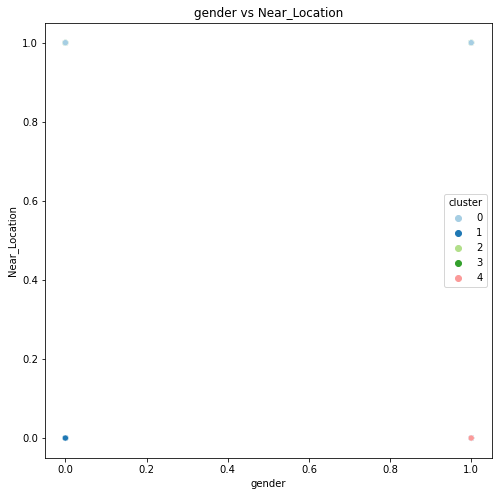

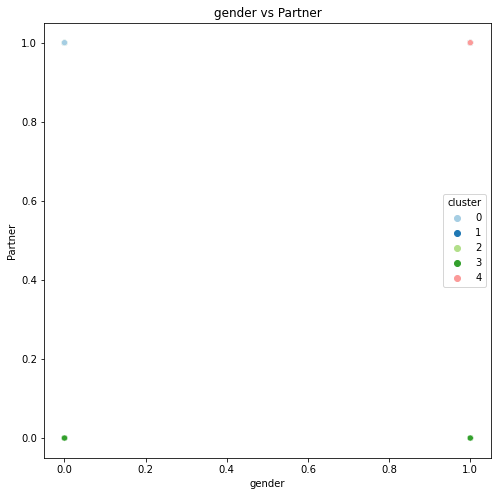

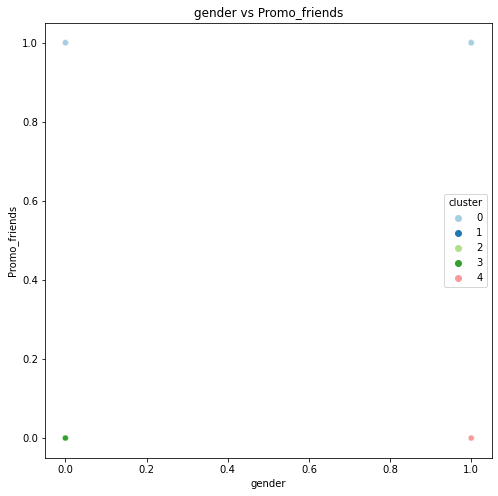

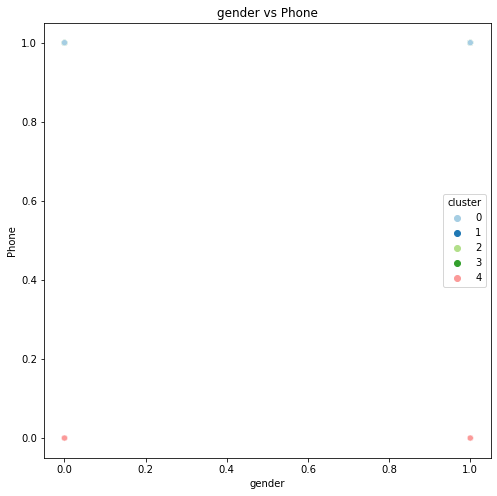

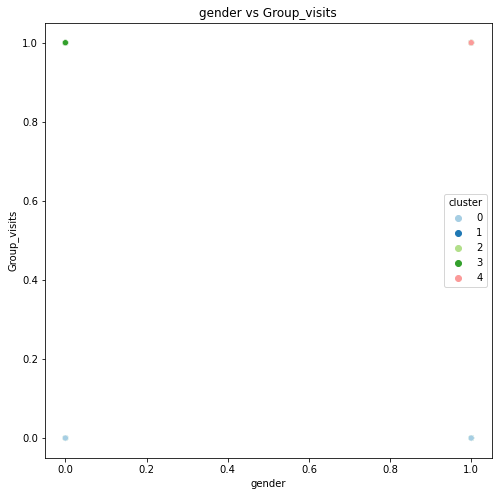

...

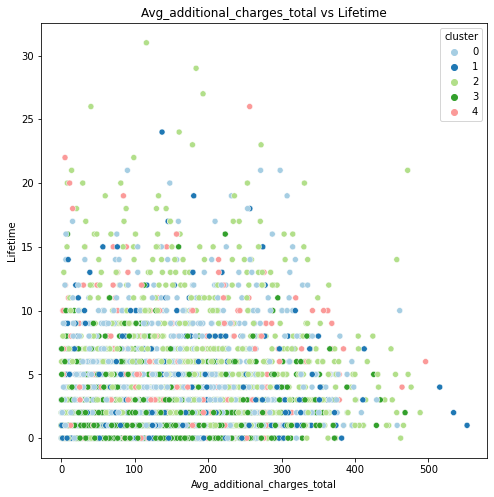

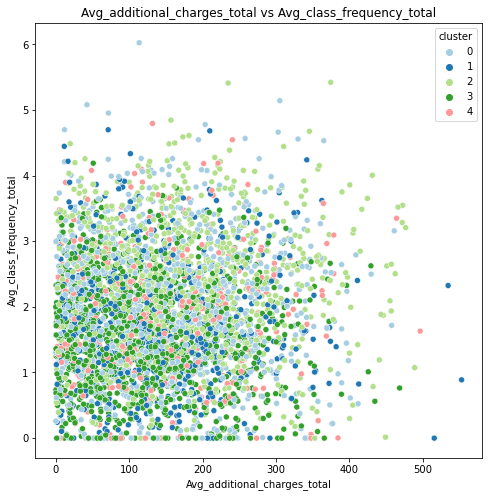

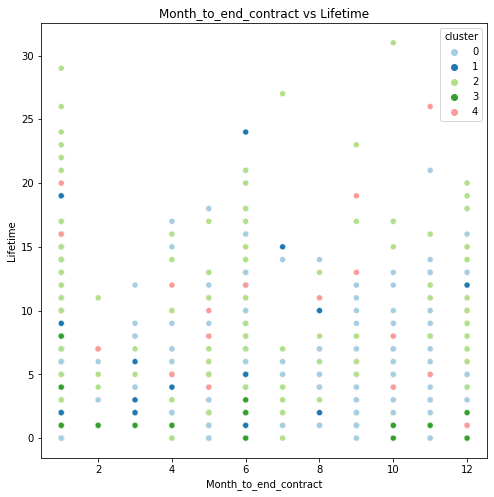

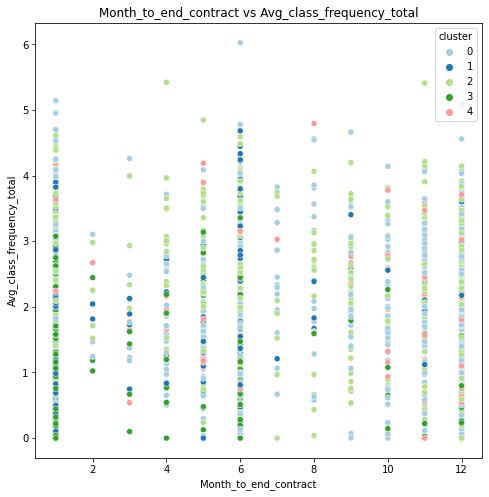

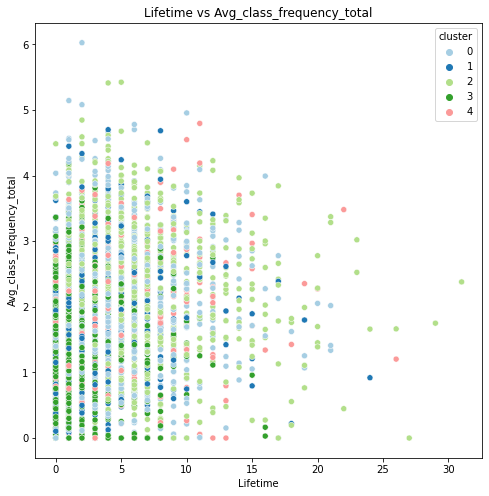

In [41]:
col_pairs = list(itertools.combinations(df_clear.drop('cluster', axis=1).columns, 2))
for pair in col_pairs:
    show_clusters_on_plot(df_clear, pair[0], pair[1], 'cluster')

Параметры пола и удаленности проживания от спортзала, участия в акции, наличия контактного телефона, участия в групповых занятиях оказались пограничными признаками. На графике видно, что они не пересекаются.


Больше всего пересечений у дополнительных расходов и частосте посещения,  возраста и дополнительных расходов, возраста и количетсва посещений, дополнительных расходов и времени с момента первого обращения в фитнес-центр.

<a id="c4"></a> 
### Доли оттоков для кластеров

Сохраним метки кластеров в основном фрейме

In [39]:
df['clasters'] = labels

In [40]:
clusters = df.groupby(['clasters']).mean()
clusters

,gender,Near_Location,Partner,Promo_friends,Phone,Group_visits,Age,Avg_additional_charges_total,Month_to_end_contract,Lifetime,Avg_class_frequency_total,Churn
clasters,,,,,,,,,,,,
0,0.498501,0.995005,0.889111,1.000000,1.0,0.519481,29.543457,152.139417,6.265734,4.210789,1.951909,0.132867
1,0.500898,0.000000,0.488330,0.077199,1.0,0.231598,28.685817,137.277472,2.804309,2.978456,1.762672,0.402154
2,0.521158,0.995546,0.417595,0.011136,1.0,0.546771,30.805122,177.103564,6.162584,5.701559,2.318701,0.016704
3,0.512090,1.000000,0.196891,0.053541,1.0,0.297064,27.818653,124.625600,1.898964,2.058722,1.539284,0.506045
4,0.523316,0.862694,0.471503,0.305699,0.0,0.427461,29.297927,144.208179,4.466321,3.940415,1.854211,0.266839


Меньше всего отток наблюдается среди клиентов поваших в кластер №2, потом следует кластер №0.  
Больше всего отток наблюдается среди клиентов попавших в кластер №3, потом следует кластер №1.

<a id="c5"></a> 
### Выводы по разделу:
Нами построена матрица расстояний и соответсвующая дендограмма. По результатам изучения которых предложено в кластеризации клиентов использовать 5 кластеров.  
По результатам анализа кластеризации по алгоритму K-Means выявлены следующие особенности построения кластеров:
- в кластере 0 выделяется факт участия в акции;
- в кластере №1 разительно отличается параметр близости нахождения к спортзалу;
- в кластере №2 участие в акции минимально, зато высокие показатели нахождения рядом с залом и участия в групповых занятиях;
- в кластере №3 низкие показатели участия в акции, но высокие показатели дополнительных покупок;
- в кластере №4 самый низкий показатель признака наличия контактных данных;
По результатам анализа доли оттока для кластеров выявлено следующее:
- меньше всего отток наблюдается среди клиентов поваших в кластер №2, потом следует кластер №0.
- больше всего отток наблюдается среди клиентов попавших в кластер №3, потом следует кластер №1.

<a id="final"></a> 
## Общий вывод и рекомендации

- изучение **средних значений и стандартных отклонений**, а также построенные гистограммы позволяют сделать следующие предварительные выводы:
    - отсутствующие признаки в датасете не обнаружены;
    - соотношение между мужчинами и женщинами примерно одинаковое;
    - большинство клиентов проживает в непосредственной близости к спортзалу, клиентами которого они являются;
    - соотношение клиентов сотрудников компаний-партнёров клуба примерно одинаковое с количеством клиентов таковыми не являющимися;
    - большинство клиентов пришли клуб не в рамках акции «приведи друга»;
    - значительное большинство клиентов оставили контактный телефон;
    - количество клиентов обладающих абонементом примерно равно количеству клиентов таковым не располагающих, при этом количество клиентов купивших абонементы на 6 и 12 месяцев примерно равны;
    - большинство клиентов не посещают групповые занятия;
    - возраст клиентов распределен нормально, в среднем клиенты от 18 до 30 лет;
    - суммарная выручка от других услуг фитнес-центра (кафе, спорттовары, косметический и массажный салон) распределена нормально со сдвигом к 0, в среднем дополнительно клиенты тратят от 70 до 210 рублей в месяц на дополнительные услуги;
    - данные по срокам до окончания текущего действующего абонемента (в месяцах) подтверждают отсутствие абонементов у большинства клиентов. Одновременно можно обратить внимание на значительное количество клиентов у которых абонементы заканчиваются через 6 и 12 месяцев, что может свидетельствовать о значительном количестве централизовано закупленных абонементов (скорее всего компаниями партнерами);
    -  анализ времени с момента первого обращения в фитнес-центр (в месяцах) показывает значительное количество новых, или относительно новых клиентов. Средняя продолжительность - 3 месяца;
    - средняя частота посещений в неделю за все время с начала действия абонемента - 1,8 посещения в месяц (медиана также - 1,8). Достаточно низкий показатель, может свидетельствовать о недостаточной мотивации значительной части клиентов в регулярном посещении занятий (скорее всего следствие значительного числа 'бесплатно' (от компаний партнеров) доставшихся абонементов);
    - средняя частота посещений в неделю за предыдущий месяц - 1,7. Что ниже (хоть и незначительно) чем среднее количество посещений клиентами в целом. Данный факт говорит нам о снижении в последний месяц количества посещений спортзала клиентами.
    - изучение показателей оттока в текущем месяце к сожалению не информативно, можно сказать, что оно значительно, вместе с тем без сравнения с предыдущими периодами конкретные выводы сделать невозможно.
- в рамках **изучения процесса оттока** получены следующие выводы:
    - соотношение между мужчинами и женщинами по оттоку примерно одинаковое;
    - по признаку проживания в непосредственной близости к спортзалу, отток клиентов проживающих в удалении от клуба несколько выше;
    - больший отток также наблюдается среди клиентов сотрудников компаний-партнёров клуба и тех кто не был участником компании приведи друга;
    - отток также не зависит от факта оставления своего контактного телефона;
    - отток явно выше среди клиентов не пользующихся абонементом и не посещающих групповые занятия;
    - по возрасту клиентов больше тенденция оттока наблюдается у клиентов от 25 до 30 лет;
    - по суммарной выручке - менее подвержены оттоку клиенты большее ее оставляющие;
    - большую часть оттока также дали клиенты у которых в изучаемом периоде закончился абонемент, либо его никогда не было;
    - также больше подвергнуты оттоку новые клиенты, посещающие спортзал в первые месяцы;
    - при изучении средней частоты посещений (как в целом, так и за месяц) выявлено, что клиенты посещающие клуб чаще меньше подвергнуты оттоку.
- по результатам **изучения корреляции признаков** получены следующие выводы :
    - в соответсвии с полученной матрицей корреляции наиболее коррелируются между собой следующие признаки:
        - средняя частота посещений в неделю за все время с начала действия абонемента ('Avg_class_frequency_total') и средняя частота посещений в неделю за предыдущий месяц ('Avg_class_frequency_current_month');
        - длительность текущего действующего абонемента ('Contract_period') и срок до окончания текущего действующего абонемента ('Month_to_end_contract').
-  построены две **модели бинарной классификации клиентов**, где целевой признак — факт оттока клиента в следующем месяце - логистической регрессии и случайного леса. Эффективность моделей оценена метриками *aсcuracy*, *precision* и *recall*. Анализ результатов показывает, что по метрике accuracy результат у моделей логистической регрессии и случайного леса примерно одинаковый, *precision* - выше у случайного леса, *recall* - выше у логистической регрессии. Одновременно нельзя не отметить, что у обоих моделей по всем метрикам результаты достаточно высокие - модели рабочие.
- построена **матрица расстояний и соответсвующая дендограмма**. По результатам изучения которых предложено в кластеризации клиентов использовать **5 кластеров**.  
- по результатам анализа кластеризации по алгоритму **K-Means** выявлены следующие особенности построения кластеров:
    - в кластере 0 выделяется факт участия в акции;
    - в кластере №1 разительно отличается параметр близости нахождения к спортзалу;
    - в кластере №2 участие в акции минимально, зато высокие показатели нахождения рядом с залом и участия в групповых занятиях;
    - в кластере №3 низкие показатели участия в акции, но высокие показатели дополнительных покупок;
    - в кластере №4 самый низкий показатель признака наличия контактных данных;
- по результатам **анализа доли оттока для кластеров** выявлено следующее:
    - меньше всего отток наблюдается среди клиентов поваших в кластер №2, потом следует кластер №0.
    - больше всего отток наблюдается среди клиентов попавших в кластер №3, потом следует кластер №1.

На основании изложенного предлагаются следующие рекомендации для стратегии взаимодействия с клиентами и их удержания:
    - использовать полученную кластеризацию в рамках построения стратегии взаимодействия с клиентами, в частности по результатам отнесения к кластерам:
    - в рамках работы с кластером 3 сосредоточиться на мерах по удержанию клиента, в том числе по повышению числа его посещений в месяц - разработать акции, которые могут мотивировать клиентов регулярно заниматься - например 2 или 3 первых занятия с тренером бесплатно, предложить скидки на долгосрочные абонементы.
    - с учетом того, что основной выделяющейся характеристикой для кластера 1 является удаленность от клуба, предлагается продумать совместные рекламные акции зала с сервисами шеринга и такси, либо проработать с партнерами воспрос групповой доставки их сотрудников в спортзал например после работы (с совместным разделением расходов), если это экономически выгодно. 
    

